# **🏠 부동산 실거래가 Baseline code**
> 부동산 실거래가 예측 대회에 오신 여러분 환영합니다! 🎉     
> 아래 baseline에서는 RandomForest를 활용해 ML 방법론들을 실제 대회에 적용해보도록 하겠습니다.
> 강의는 google colab으로 실행하였기에 아래의 베이스라인 코드와는 일부 차이가 있을 수 있습니다. 

## Contents
- Library Import
- Data Load
- Data Preprocessing
- Feature Engineering
- Model Training
- Inference
- Output File Save


## 1. Library Import
- 필요한 라이브러리를 불러옵니다.

In [1]:
!pip install eli5==0.13.0

# 한글 폰트 사용을 위한 라이브러리입니다.
!apt-get install -y fonts-nanum
!pip install openpyxl

Reading package lists... Done
Building dependency tree       
Reading state information... Done
fonts-nanum is already the newest version (20180306-3).
0 upgraded, 0 newly installed, 0 to remove and 14 not upgraded.


In [2]:
# visualization
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
fe = fm.FontEntry(
    fname=r'/usr/share/fonts/truetype/nanum/NanumGothic.ttf', # ttf 파일이 저장되어 있는 경로
    name='NanumBarunGothic')                        # 이 폰트의 원하는 이름 설정
fm.fontManager.ttflist.insert(0, fe)              # Matplotlib에 폰트 추가
plt.rcParams.update({'font.size': 10, 'font.family': 'NanumBarunGothic'}) # 폰트 설정
plt.rc('font', family='NanumBarunGothic')
import seaborn as sns

# utils
import pandas as pd
import numpy as np
from tqdm import tqdm
import pickle
import warnings;warnings.filterwarnings('ignore')

# Model
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn import metrics

import eli5
from eli5.sklearn import PermutationImportance

## 2. Data Load

#### 2.1. 데이터 로드

In [3]:
# 필요한 데이터를 load 하겠습니다. 경로는 환경에 맞게 지정해주면 됩니다.
train_path = '/data/ephemeral/home/train.csv'
test_path  = '/data/ephemeral/home/test.csv'
dt = pd.read_csv(train_path)
dt_test = pd.read_csv(test_path)

In [4]:
# Train data와 Test data shape은 아래와 같습니다.
print('Train data shape : ', dt.shape, 'Test data shape : ', dt_test.shape)

Train data shape :  (1118822, 52) Test data shape :  (9272, 51)


In [5]:
# Train과 Test data를 살펴보겠습니다.
display(dt.head(1))
display(dt_test.head(1))      # 부동산 실거래가(=Target) column이 제외된 모습입니다.

,시군구,번지,본번,부번,아파트명,전용면적(㎡),계약년월,계약일,층,건축년도,...,건축면적,주차대수,기타/의무/임대/임의=1/2/3/4,단지승인일,사용허가여부,관리비 업로드,좌표X,좌표Y,단지신청일,target
0,서울특별시 강남구 개포동,658-1,658.0,1.0,개포6차우성,79.97,201712,8,3,1987,...,4858.0,262.0,임의,2022-11-17 13:00:29.0,Y,N,127.05721,37.476763,2022-11-17 10:19:06.0,124000


,시군구,번지,본번,부번,아파트명,전용면적(㎡),계약년월,계약일,층,건축년도,...,청소비관리형태,건축면적,주차대수,기타/의무/임대/임의=1/2/3/4,단지승인일,사용허가여부,관리비 업로드,좌표X,좌표Y,단지신청일
0,서울특별시 강남구 개포동,658-1,658.0,1.0,개포6차우성,79.97,202307,26,5,1987,...,직영,4858.0,262.0,임의,2022-11-17 13:00:29.0,Y,N,127.05721,37.476763,2022-11-17 10:19:06.0


## 3. Data Preprocessing

- 모델링 전에 데이터 내 결측치, 이상치 등을 제거하고 범주형과 연속형 변수를 살펴보도록 하겠습니다!
- 먼저, 용이한 전처리를 위해 train과 test data를 합친 하나의 데이터로 진행하도록 하겠습니다.

In [6]:
# train/test 구분을 위한 칼럼을 하나 만들어 줍니다.
dt['is_test'] = 0
dt_test['is_test'] = 1
concat = pd.concat([dt, dt_test])     # 하나의 데이터로 만들어줍니다.

In [7]:
concat['is_test'].value_counts()      # train과 test data가 하나로 합쳐진 것을 확인할 수 있습니다.

is_test
0    1118822
1       9272
Name: count, dtype: int64

In [8]:
# 칼럼 이름을 쉽게 바꿔주겠습니다. 다른 칼럼도 사용에 따라 바꿔주셔도 됩니다!
concat = concat.rename(columns={'전용면적(㎡)':'전용면적'})

In [9]:
concat.shape

(1128094, 53)

In [12]:
# concat['기타/의무/임대/임의=1/2/3/4'].isnull().sum()

### 3.1. 결측치 탐색 및 보간
- 결측치를 처리할 때 많이 쓰는 방법은 삭제(Deletion)과 대체(Imputation) 입니다.
- 본 Baseline에서는 결측치가 90% 이상을 차지하는 변수의 결측치는 제거하고, 나머지 결측치는 대체하도록 하겠습니다.
  - 연속형 변수의 경우에는 선형보간(Linear interpolation)으로 대체하겠습니다.
  - 범주형 변수의 경우에는 'NULL' 이라는 임의의 범주로 대체해주도록 하겠습니다.

- 참고 ✅
  - 선형보간(Linear interpolation)이란 두 점의 값이 주어졌을 때 **그 사이의 값**을 추정하기 위해 직선 거리에 따라 선형적으로 계산하는 방법입니다.
  - 아래 두개의 붉은 점 사이에 ($x$, $y$) 값을 추정하기 위해, 해당 점이 두 붉은 점을 이은 선형적인 선분에 있다고 가정하고, 단순 비례식으로 ($x$, $y$)를 추정해 보간하는 방법입니다.
  - [참고자료](https://ko.wikipedia.org/wiki/%EC%84%A0%ED%98%95_%EB%B3%B4%EA%B0%84%EB%B2%95#:~:text=%EC%84%A0%ED%98%95%20%EB%B3%B4%EA%B0%84%EB%B2%95(%E7%B7%9A%E5%9E%8B%E8%A3%9C%E9%96%93%E6%B3%95,%EC%9C%BC%EB%A1%9C%20%EA%B3%84%EC%82%B0%ED%95%98%EB%8A%94%20%EB%B0%A9%EB%B2%95%EC%9D%B4%EB%8B%A4.)


> 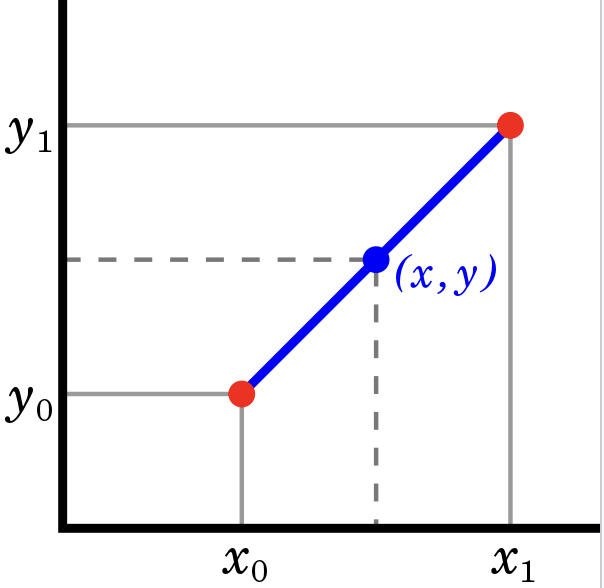

In [10]:
# concat['기타/의무/임대/임의=1/2/3/4'].value_counts().head()

In [11]:
# 실제로 결측치라고 표시는 안되어있지만 아무 의미도 갖지 않는 element들이 아래와 같이 존재합니다.
# 아래 3가지의 경우 모두 아무 의미도 갖지 않는 element가 포함되어 있습니다.
display(concat['등기신청일자'].value_counts())

등기신청일자
            1111271
20230630        585
20230831        496
20230428        394
20230731        374
             ...   
20230105          3
20230125          3
20230109          1
20230102          1
20230104          1
Name: count, Length: 182, dtype: int64

In [12]:
display(concat['거래유형'].value_counts())

거래유형
-       1086451
중개거래      38123
직거래        3520
Name: count, dtype: int64

In [13]:
display(concat['중개사소재지'].value_counts())

중개사소재지
-                    1090013
서울 노원구                  2627
서울 송파구                  2540
서울 강남구                  2508
서울 강동구                  2038
                      ...   
서울 강북구, 서울 양천구             1
경기 남양주시, 경기 성남수정구          1
서울 송파구, 인천 계양구             1
경기 연천군, 서울 송파구             1
서울 중랑구, 인천 부평구             1
Name: count, Length: 739, dtype: int64

In [14]:
# 위 처럼 아무 의미도 갖지 않는 칼럼은 결측치와 같은 역할을 하므로, np.nan으로 채워 결측치로 인식되도록 합니다.
concat['등기신청일자'] = concat['등기신청일자'].replace(' ', np.nan)
concat['거래유형'] = concat['거래유형'].replace('-', np.nan)
concat['중개사소재지'] = concat['중개사소재지'].replace('-', np.nan)

In [494]:
# concat = concat[concat['계약년월'] > 201500]

In [15]:
concat.shape

(1128094, 53)

In [16]:
concat.head(3)

,시군구,번지,본번,부번,아파트명,전용면적,계약년월,계약일,층,건축년도,...,주차대수,기타/의무/임대/임의=1/2/3/4,단지승인일,사용허가여부,관리비 업로드,좌표X,좌표Y,단지신청일,target,is_test
0,서울특별시 강남구 개포동,658-1,658.0,1.0,개포6차우성,79.97,201712,8,3,1987,...,262.0,임의,2022-11-17 13:00:29.0,Y,N,127.05721,37.476763,2022-11-17 10:19:06.0,124000.0,0
1,서울특별시 강남구 개포동,658-1,658.0,1.0,개포6차우성,79.97,201712,22,4,1987,...,262.0,임의,2022-11-17 13:00:29.0,Y,N,127.05721,37.476763,2022-11-17 10:19:06.0,123500.0,0
2,서울특별시 강남구 개포동,658-1,658.0,1.0,개포6차우성,54.98,201712,28,5,1987,...,262.0,임의,2022-11-17 13:00:29.0,Y,N,127.05721,37.476763,2022-11-17 10:19:06.0,91500.0,0


In [17]:
#rate_path = '/data/ephemeral/home/code/rate_excel.xlsx'
#rate_data = pd.read_excel(rate_path)
#rate_data.head()

In [18]:
# 필요한 라이브러리 불러오기
import pandas as pd

# 데이터 파일 경로 설정
#train_path = '/mnt/data/test.csv'
rate_path = '/data/ephemeral/home/code/rate1000_excel.xlsx'

# 데이터 불러오기
concat_data = concat
rate_data = pd.read_excel(rate_path)

# rate 데이터 재구조화
rate_data_melted = rate_data.melt(id_vars=['Month'], var_name='Year', value_name='Rate')

# Year와 Month를 문자열로 변환하고 YearMonth 컬럼 생성
concat_data['YearMonth'] = concat_data['계약년월'].astype(str)
rate_data_melted['YearMonth'] = rate_data_melted['Year'].astype(str) + rate_data_melted['Month'].astype(str)

# YearMonth를 기준으로 병합
test_data_merged = pd.merge(concat_data, rate_data_melted, how='left', on='YearMonth')

# 불필요한 '단지신청일' 컬럼 제거
test_data_merged.drop(['단지신청일'], axis=1, inplace=True)

# 결과 확인
test_data_merged.head()


,시군구,번지,본번,부번,아파트명,전용면적,계약년월,계약일,층,건축년도,...,사용허가여부,관리비 업로드,좌표X,좌표Y,target,is_test,YearMonth,Month,Year,Rate
0,서울특별시 강남구 개포동,658-1,658.0,1.0,개포6차우성,79.97,201712,8,3,1987,...,Y,N,127.05721,37.476763,124000.0,0,201712,12,2017,1500.0
1,서울특별시 강남구 개포동,658-1,658.0,1.0,개포6차우성,79.97,201712,22,4,1987,...,Y,N,127.05721,37.476763,123500.0,0,201712,12,2017,1500.0
2,서울특별시 강남구 개포동,658-1,658.0,1.0,개포6차우성,54.98,201712,28,5,1987,...,Y,N,127.05721,37.476763,91500.0,0,201712,12,2017,1500.0
3,서울특별시 강남구 개포동,658-1,658.0,1.0,개포6차우성,79.97,201801,3,4,1987,...,Y,N,127.05721,37.476763,130000.0,0,201801,01,2018,1750.0
4,서울특별시 강남구 개포동,658-1,658.0,1.0,개포6차우성,79.97,201801,8,2,1987,...,Y,N,127.05721,37.476763,117000.0,0,201801,01,2018,1750.0


In [19]:
test_data_merged.shape

(1128094, 56)

In [20]:
test_data_merged.sample(3)

,시군구,번지,본번,부번,아파트명,전용면적,계약년월,계약일,층,건축년도,...,사용허가여부,관리비 업로드,좌표X,좌표Y,target,is_test,YearMonth,Month,Year,Rate
153934,서울특별시 광진구 자양동,779-11,779.0,11.0,구의현대하이엘,59.40,200906,16,17,2005,...,NaN,NaN,NaN,NaN,32600.0,0,200906,06,2009,2000.0
610262,서울특별시 서초구 잠원동,60-3,60.0,3.0,신반포8,52.74,201510,29,5,1981,...,NaN,NaN,NaN,NaN,70700.0,0,201510,10,2015,1500.0
1038741,서울특별시 노원구 하계동,284,284.0,0.0,한신1,27.00,200806,12,11,1988,...,NaN,NaN,NaN,NaN,13700.0,0,200806,06,2008,3000.0


In [21]:
test_data_merged.drop(['Month'], axis=1, inplace=True)
test_data_merged.drop(['Year'], axis=1, inplace=True)
test_data_merged.drop(['계약년월'], axis=1, inplace=True)

In [22]:
merged_df = test_data_merged
merged_df.head(3)

,시군구,번지,본번,부번,아파트명,전용면적,계약일,층,건축년도,도로명,...,기타/의무/임대/임의=1/2/3/4,단지승인일,사용허가여부,관리비 업로드,좌표X,좌표Y,target,is_test,YearMonth,Rate
0,서울특별시 강남구 개포동,658-1,658.0,1.0,개포6차우성,79.97,8,3,1987,언주로 3,...,임의,2022-11-17 13:00:29.0,Y,N,127.05721,37.476763,124000.0,0,201712,1500.0
1,서울특별시 강남구 개포동,658-1,658.0,1.0,개포6차우성,79.97,22,4,1987,언주로 3,...,임의,2022-11-17 13:00:29.0,Y,N,127.05721,37.476763,123500.0,0,201712,1500.0
2,서울특별시 강남구 개포동,658-1,658.0,1.0,개포6차우성,54.98,28,5,1987,언주로 3,...,임의,2022-11-17 13:00:29.0,Y,N,127.05721,37.476763,91500.0,0,201712,1500.0


In [23]:
# EDA에 앞서 결측치를 확인해보겠습니다.
merged_df.isnull().sum()

시군구                             0
번지                            227
본번                             75
부번                             75
아파트명                         2136
전용면적                            0
계약일                             0
층                               0
건축년도                            0
도로명                             0
해제사유발생일                   1121899
등기신청일자                    1111271
거래유형                      1086451
중개사소재지                    1090013
k-단지분류(아파트,주상복합등등)         877273
k-전화번호                     876850
k-팩스번호                     879348
단지소개기존clob                1058958
k-세대타입(분양형태)               876125
k-관리방식                     876125
k-복도유형                     876454
k-난방방식                     876125
k-전체동수                     877207
k-전체세대수                    876125
k-건설사(시공사)                 877637
k-시행사                      877834
k-사용검사일-사용승인일              876259
k-연면적                      876125
k-주거전용면적                   876170
k-관리비부과면적     

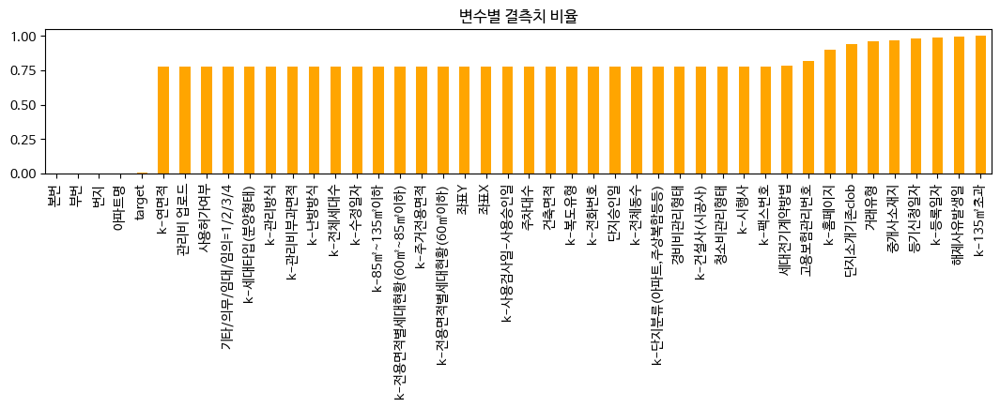

In [24]:
# 변수별 결측치의 비율을 plot으로 그려보면 아래와 같습니다.
fig = plt.figure(figsize=(13, 2))
missing = merged_df.isnull().sum() / merged_df.shape[0]
missing = missing[missing > 0]
missing.sort_values(inplace=True)
missing.plot.bar(color='orange')
plt.title('변수별 결측치 비율')
plt.show()

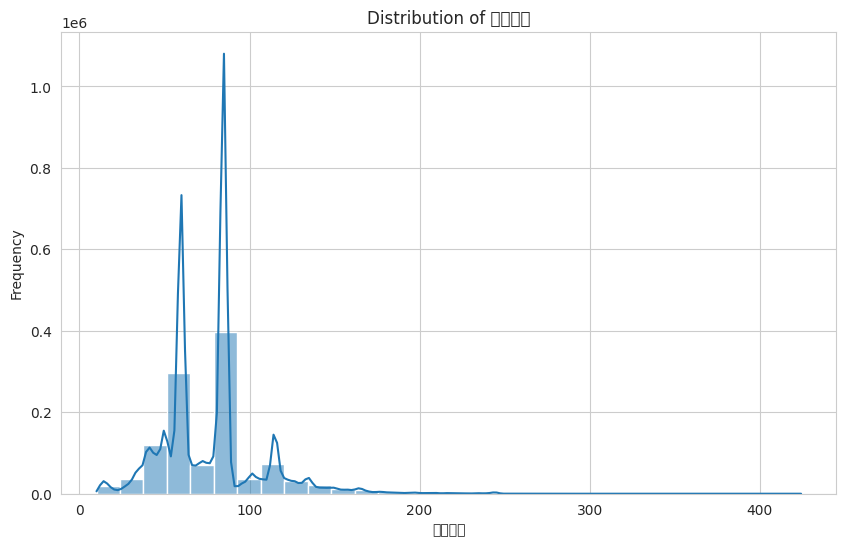

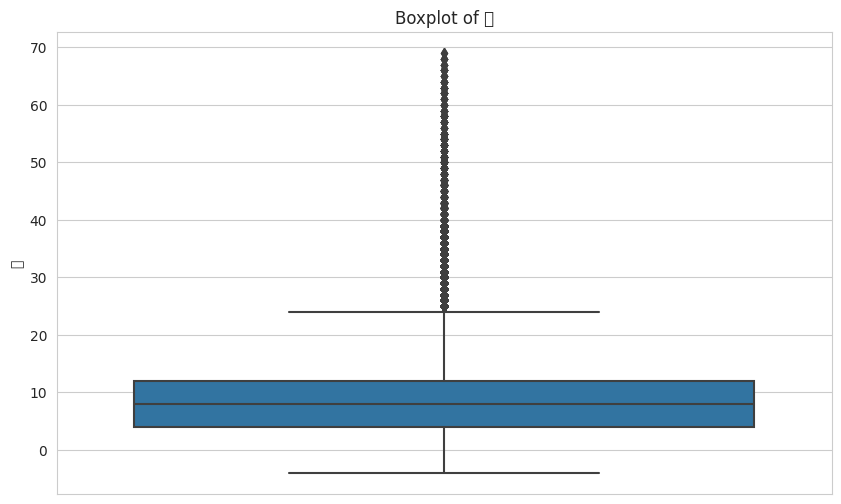

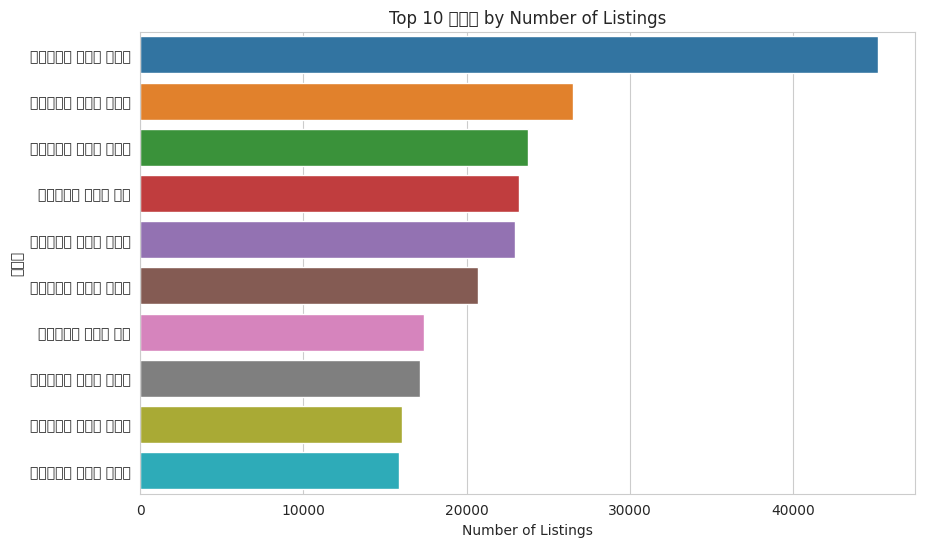

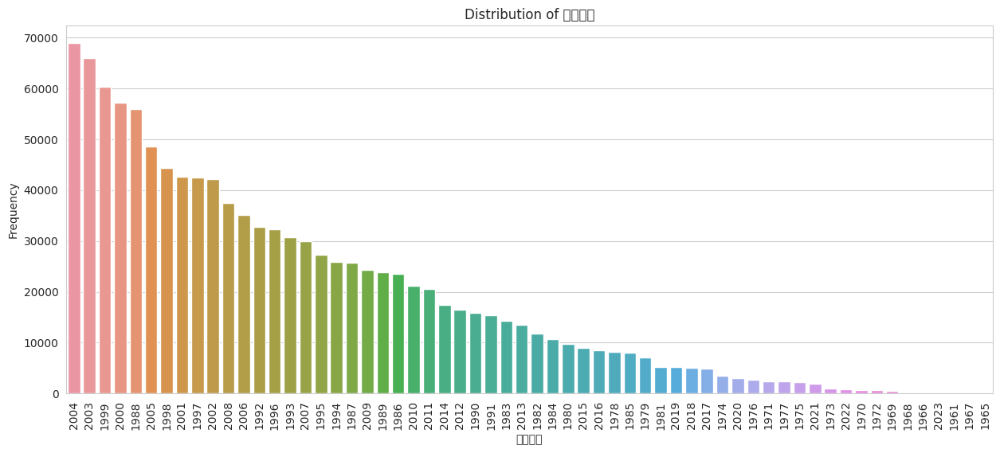

In [25]:
# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# 1. Histogram for '전용면적(㎡)'
plt.figure(figsize=(10, 6))
sns.histplot(merged_df['전용면적'], bins=30, kde=True)
plt.title('Distribution of 전용면적')
plt.xlabel('전용면적')
plt.ylabel('Frequency')
plt.show()

# 2. Boxplot for '층'
plt.figure(figsize=(10, 6))
sns.boxplot(y=merged_df['층'])
plt.title('Boxplot of 층')
plt.ylabel('층')
plt.show()

# 3. Bar plot for the top 10 '시군구'
plt.figure(figsize=(10, 6))
top_sigungu = merged_df['시군구'].value_counts().head(10)
sns.barplot(x=top_sigungu.values, y=top_sigungu.index)
plt.title('Top 10 시군구 by Number of Listings')
plt.xlabel('Number of Listings')
plt.ylabel('시군구')
plt.show()

# 4. Bar plot for '건축년도' distribution
plt.figure(figsize=(15, 6))
sns.countplot(x='건축년도', data=merged_df, order = merged_df['건축년도'].value_counts().index)
plt.title('Distribution of 건축년도')
plt.xlabel('건축년도')
plt.ylabel('Frequency')
plt.xticks(rotation=90)
plt.show()


In [26]:
# merged_df = concat

- 위 그래프에서 볼 수 있다시피 결측치가 100만개 이상인 칼럼들은 결측치가 해당 칼럼의 element 중 90% 이상을 차지하는 상황이 됩니다.
- 따라서 본 Baseline 에서는 이 칼럼은 예측에 도움이 되지 않는다고 판단해 삭제해주도록 하겠습니다.

In [27]:
# Null값이 100만개 이상인 칼럼은 삭제해보도록 하겠습니다.
print("* 결측치가 100만개 이하인 변수들 :", list(merged_df.columns[merged_df.isnull().sum() <= 1000000]))     # 남겨질 변수들은 아래와 같습니다.
print("* 결측치가 100만개 이상인 변수들 :", list(merged_df.columns[merged_df.isnull().sum() >= 1000000]))

* 결측치가 100만개 이하인 변수들 : ['시군구', '번지', '본번', '부번', '아파트명', '전용면적', '계약일', '층', '건축년도', '도로명', 'k-단지분류(아파트,주상복합등등)', 'k-전화번호', 'k-팩스번호', 'k-세대타입(분양형태)', 'k-관리방식', 'k-복도유형', 'k-난방방식', 'k-전체동수', 'k-전체세대수', 'k-건설사(시공사)', 'k-시행사', 'k-사용검사일-사용승인일', 'k-연면적', 'k-주거전용면적', 'k-관리비부과면적', 'k-전용면적별세대현황(60㎡이하)', 'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하', 'k-수정일자', '고용보험관리번호', '경비비관리형태', '세대전기계약방법', '청소비관리형태', '건축면적', '주차대수', '기타/의무/임대/임의=1/2/3/4', '단지승인일', '사용허가여부', '관리비 업로드', '좌표X', '좌표Y', 'target', 'is_test', 'YearMonth', 'Rate']
* 결측치가 100만개 이상인 변수들 : ['해제사유발생일', '등기신청일자', '거래유형', '중개사소재지', '단지소개기존clob', 'k-135㎡초과', 'k-홈페이지', 'k-등록일자']


In [93]:
# 위에서 결측치가 100만개 이하인 변수들만 골라 새로운 concat_select 객체로 저장해줍니다.
selected = list(merged_df.columns[merged_df.isnull().sum() <= 1000000])
merged_df_select = merged_df[selected]

In [94]:
merged_df_select.isnull().sum()     # 결측치가 100만개 초과인 칼럼이 제거된 모습은 아래와 같습니다.
# target변수는 test dataset 개수만큼(9272) 결측치가 존재함을 확인할 수 있습니다.

시군구                            0
번지                           227
본번                            75
부번                            75
아파트명                        2136
전용면적                           0
계약일                            0
층                              0
건축년도                           0
도로명                            0
k-단지분류(아파트,주상복합등등)        877273
k-전화번호                    876850
k-팩스번호                    879348
k-세대타입(분양형태)              876125
k-관리방식                    876125
k-복도유형                    876454
k-난방방식                    876125
k-전체동수                    877207
k-전체세대수                   876125
k-건설사(시공사)                877637
k-시행사                     877834
k-사용검사일-사용승인일             876259
k-연면적                     876125
k-주거전용면적                  876170
k-관리비부과면적                 876125
k-전용면적별세대현황(60㎡이하)        876170
k-전용면적별세대현황(60㎡~85㎡이하)    876170
k-85㎡~135㎡이하              876170
k-수정일자                    876170
고용보험관리번호                  920757
경비비관리형태   

In [95]:
# 연속형 변수는 선형보간을 해주고, 범주형변수는 알수없기에 “unknown”이라고 임의로 보간해 주겠습니다.
merged_df_select.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1128094 entries, 0 to 1128093
Data columns (total 45 columns):
 #   Column                  Non-Null Count    Dtype  
---  ------                  --------------    -----  
 0   시군구                     1128094 non-null  object 
 1   번지                      1127867 non-null  object 
 2   본번                      1128019 non-null  float64
 3   부번                      1128019 non-null  float64
 4   아파트명                    1125958 non-null  object 
 5   전용면적                    1128094 non-null  float64
 6   계약일                     1128094 non-null  int64  
 7   층                       1128094 non-null  int64  
 8   건축년도                    1128094 non-null  int64  
 9   도로명                     1128094 non-null  object 
 10  k-단지분류(아파트,주상복합등등)      250821 non-null   object 
 11  k-전화번호                  251244 non-null   object 
 12  k-팩스번호                  248746 non-null   object 
 13  k-세대타입(분양형태)            251969 non-null   object 
 14  k-

In [96]:
# 본번, 부번의 경우 float로 되어있지만 범주형 변수의 의미를 가지므로 object(string) 형태로 바꾸어주고 아래 작업을 진행하겠습니다.
merged_df_select['본번'] = merged_df_select['본번'].astype('str')
merged_df_select['부번'] = merged_df_select['부번'].astype('str')

In [97]:
#계약년월 컬럼을 연속형으로 변환 
merged_df_select['YearMonth'] = merged_df_select['YearMonth'].astype('int')

In [98]:
# 'k-시행사' 컬럼의 null 값은 0으로, 나머지는 1로 채움
merged_df_select['k-시행사'] = merged_df_select['k-시행사'].apply(lambda x: 0 if pd.isnull(x) else 1)

In [99]:
# 먼저, 연속형 변수와 범주형 변수를 위 info에 따라 분리해주겠습니다.
continuous_columns = []
categorical_columns = []

for column in merged_df_select.columns:
    if pd.api.types.is_numeric_dtype(merged_df_select[column]):
        continuous_columns.append(column)
    else:
        categorical_columns.append(column)

print("연속형 변수:", continuous_columns)
print("범주형 변수:", categorical_columns)

연속형 변수: ['전용면적', '계약일', '층', '건축년도', 'k-전체동수', 'k-전체세대수', 'k-시행사', 'k-연면적', 'k-주거전용면적', 'k-관리비부과면적', 'k-전용면적별세대현황(60㎡이하)', 'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하', '건축면적', '주차대수', '좌표X', '좌표Y', 'target', 'is_test', 'YearMonth', 'Rate']
범주형 변수: ['시군구', '번지', '본번', '부번', '아파트명', '도로명', 'k-단지분류(아파트,주상복합등등)', 'k-전화번호', 'k-팩스번호', 'k-세대타입(분양형태)', 'k-관리방식', 'k-복도유형', 'k-난방방식', 'k-건설사(시공사)', 'k-사용검사일-사용승인일', 'k-수정일자', '고용보험관리번호', '경비비관리형태', '세대전기계약방법', '청소비관리형태', '기타/의무/임대/임의=1/2/3/4', '단지승인일', '사용허가여부', '관리비 업로드']


- 연속형 변수와 범주형 변수가 알맞게 나누어졌는지 확인해보고, 이제 각각 보간을 진행합니다.

In [100]:
# 범주형 변수에 대한 보간
merged_df_select[categorical_columns] = merged_df_select[categorical_columns].fillna('NULL')

# 연속형 변수에 대한 보간 (선형 보간)
merged_df_select[continuous_columns] = merged_df_select[continuous_columns].interpolate(method='linear', axis=0)

In [101]:
merged_df_select.isnull().sum()         # 결측치가 보간된 모습을 확인해봅니다.

시군구                       0
번지                        0
본번                        0
부번                        0
아파트명                      0
전용면적                      0
계약일                       0
층                         0
건축년도                      0
도로명                       0
k-단지분류(아파트,주상복합등등)        0
k-전화번호                    0
k-팩스번호                    0
k-세대타입(분양형태)              0
k-관리방식                    0
k-복도유형                    0
k-난방방식                    0
k-전체동수                    0
k-전체세대수                   0
k-건설사(시공사)                0
k-시행사                     0
k-사용검사일-사용승인일             0
k-연면적                     0
k-주거전용면적                  0
k-관리비부과면적                 0
k-전용면적별세대현황(60㎡이하)        0
k-전용면적별세대현황(60㎡~85㎡이하)    0
k-85㎡~135㎡이하              0
k-수정일자                    0
고용보험관리번호                  0
경비비관리형태                   0
세대전기계약방법                  0
청소비관리형태                   0
건축면적                      0
주차대수                      0
기타/의무/임대/임의=1/2/3/4 

- Baseline에서는 단순 결측치들을 제거하거나 보간했지만,
EDA를 통해 변수들의 흐름을 조금 더 파악하고 더 나은 interpolation 등의 방법을 고려해볼 수 있을 것 같습니다.

### 3.2. 이상치 처리
- 이번엔 이상치를 처리해봅시다.
- 이상치를 처리하는 방법은 IQR, Z-score 등 다양한 방법이 있습니다. 가장 쉽고 직관적으로 접근하는 방법은 기본 통계치를 이용하는 것입니다.
- 본 baseline에서는 IQR를 이용한 방법을 사용하겠습니다.

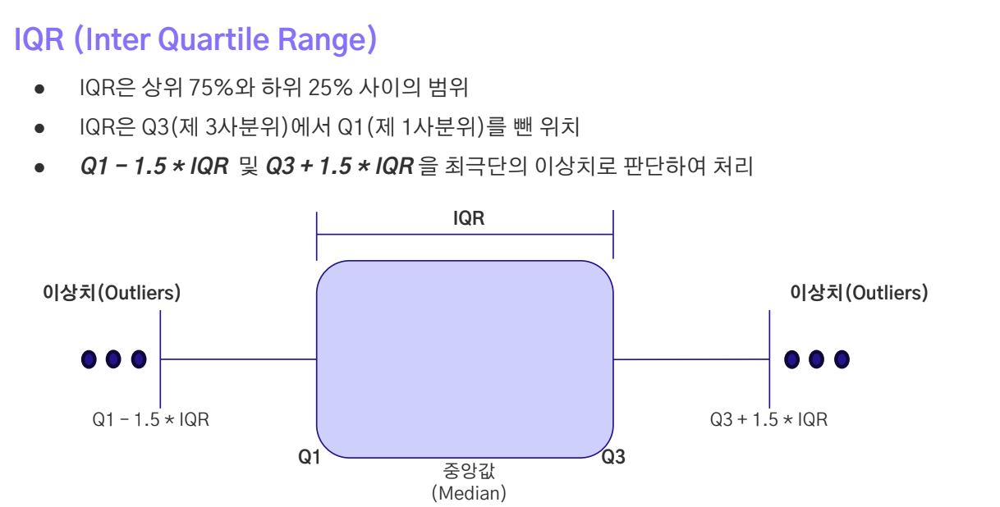

In [102]:
# 이상치 제거 이전의 shape은 아래와 같습니다.
print(merged_df_select.shape)

(1128094, 45)


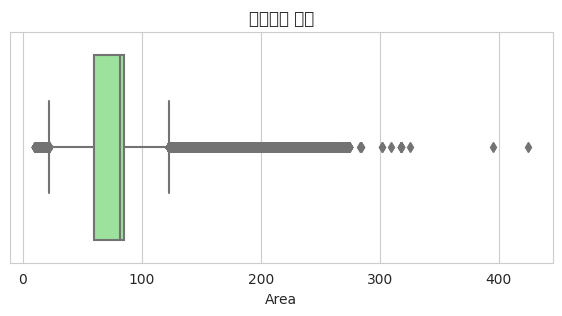

In [103]:
# 대표적인 연속형 변수인 “전용 면적” 변수 관련한 분포를 먼저 살펴보도록 하겠습니다.
fig = plt.figure(figsize=(7, 3))
sns.boxplot(data = merged_df_select, x = "전용면적", color="lightgreen")
plt.title("전용면적 분포")
plt.xlabel("Area")
plt.show()

In [104]:
# 이상치 제거 방법에는 IQR을 이용하겠습니다.
def remove_outliers_iqr(dt, column_name):
    df = dt.query('is_test == 0')       # train data 내에 있는 이상치만 제거하도록 하겠습니다.
    df_test = dt.query('is_test == 1')

    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    df = df[(df[column_name] >= lower_bound) & (df[column_name] <= upper_bound)]

    result = pd.concat([df, df_test])   # test data와 다시 합쳐주겠습니다.
    return result

In [105]:
# 위 방법으로 전용 면적에 대한 이상치를 제거해보겠습니다.
merged_df_select = remove_outliers_iqr(merged_df_select, '전용면적')

In [106]:
# 이상치 제거 후의 shape은 아래와 같습니다. 약 10만개의 데이터가 제거된 모습을 확인할 수 있습니다.
print(merged_df_select.shape)

(1038846, 45)


In [107]:
merged_df_select['is_test'].value_counts()     # 또한, train data만 제거되었습니다.

is_test
0    1029574
1       9272
Name: count, dtype: int64

## 4. Feature Engineering
- 이제 파생변수를 만들어보도록 하겠습니다.
- 파생 변수는 도메인 지식에 기반해 제작하는 것이 중요합니다.
- 주택의 가격을 예측하는 문제이기 때문에 약간의 부동산 지식을 기반으로 파생 변수를 만들어 보도록 하겠습니다.

In [108]:
# 시군구, 년월 등 분할할 수 있는 변수들은 세부사항 고려를 용이하게 하기 위해 모두 분할해 주겠습니다.
merged_df_select['구'] = merged_df_select['시군구'].map(lambda x : x.split()[1])
merged_df_select['동'] = merged_df_select['시군구'].map(lambda x : x.split()[2])
del merged_df_select['시군구']

# 계약년월을 위에서 처리해 주었기에 주석 처리
# merged_df_select['계약년'] = merged_df_select['계약년월'].astype('str').map(lambda x : x[:4])
# merged_df_select['계약월'] = merged_df_select['계약년월'].astype('str').map(lambda x : x[4:])
# del merged_df_select['계약년월']

In [109]:
merged_df_select.columns

Index(['번지', '본번', '부번', '아파트명', '전용면적', '계약일', '층', '건축년도', '도로명',
       'k-단지분류(아파트,주상복합등등)', 'k-전화번호', 'k-팩스번호', 'k-세대타입(분양형태)', 'k-관리방식',
       'k-복도유형', 'k-난방방식', 'k-전체동수', 'k-전체세대수', 'k-건설사(시공사)', 'k-시행사',
       'k-사용검사일-사용승인일', 'k-연면적', 'k-주거전용면적', 'k-관리비부과면적', 'k-전용면적별세대현황(60㎡이하)',
       'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하', 'k-수정일자', '고용보험관리번호',
       '경비비관리형태', '세대전기계약방법', '청소비관리형태', '건축면적', '주차대수', '기타/의무/임대/임의=1/2/3/4',
       '단지승인일', '사용허가여부', '관리비 업로드', '좌표X', '좌표Y', 'target', 'is_test',
       'YearMonth', 'Rate', '구', '동'],
      dtype='object')

- 서울의 집값은 강남, 강북 여부에 따라 차이가 많이 난다는 사실은 많이 알려진 사실입니다.
- 따라서 강남/강북의 여부에 따라 파생변수를 생성해주도록 하겠습니다.

In [609]:
'''all = list(merged_df_select['구'].unique())
gangnam = ['강서구', '영등포구', '동작구', '서초구', '강남구', '송파구', '강동구']
gangbuk = [x for x in all if x not in gangnam]

assert len(all) == len(gangnam) + len(gangbuk)       # 알맞게 분리되었는지 체크합니다.'''

In [610]:
'''# 강남의 여부를 체크합니다.
is_gangnam = []
for x in merged_df_select['구'].tolist() :
  if x in gangnam :
    is_gangnam.append(1)
  else :
    is_gangnam.append(0)

# 파생변수를 하나 만릅니다.
merged_df_select['강남여부'] = is_gangnam'''

In [110]:
# 데이터프레임의 '구' 컬럼에 대해 레이블을 지정하는 함수 정의
def label_district(row):
    if row in ['강남구', '서초구','용산구', '송파구']:
        return 0
    elif row in ['성동구', '마포구']:
        return 1
    else:
        return 2

# apply 함수를 사용하여 각 행의 '구' 컬럼에 레이블링 함수 적용
merged_df_select['구_label'] = merged_df_select['구'].apply(label_district)

# 결과 확인
print(merged_df_select[['구', '구_label']].head())

     구  구_label
0  강남구        0
1  강남구        0
2  강남구        0
3  강남구        0
4  강남구        0


In [111]:
merged_df_select.drop(['구'], axis=1, inplace=True)
merged_df_select = merged_df_select.rename(columns={'구_label': '구'})

In [112]:
# 데이터프레임의 '동' 컬럼에 대해 레이블을 지정하는 함수 정의
def label_district(row):
    if row in ['개포동', '반포동','압구정동', '잠원동','대치동','평동','신원동','잠실동','일원동','수서동']:
        return 0
    elif row in ['홍파동','삼성동','청담동','만리동2가','교북동','도곡동','용산동5가','역삼동','신천동','성수동1가']:
        return 1
    else:
        return 2

# apply 함수를 사용하여 각 행의 '동' 컬럼에 레이블링 함수 적용
merged_df_select['동_label'] = merged_df_select['동'].apply(label_district)

# 결과 확인
print(merged_df_select[['동', '동_label']].head())

     동  동_label
0  개포동        0
1  개포동        0
2  개포동        0
3  개포동        0
4  개포동        0


In [113]:
merged_df_select.drop(['동'], axis=1, inplace=True)
merged_df_select = merged_df_select.rename(columns={'동_label': '동'})

In [114]:
merged_df_select.sample(10)

,번지,본번,부번,아파트명,전용면적,계약일,층,건축년도,도로명,"k-단지분류(아파트,주상복합등등)",...,사용허가여부,관리비 업로드,좌표X,좌표Y,target,is_test,YearMonth,Rate,구,동
774906,691-1,691.0,1.0,동성,101.88,1,1,1995,강서로68길 108,NULL,...,NULL,NULL,126.841610,37.564768,36000.0,0,201310,2500.0,2,2
358208,784,784.0,0.0,세림,40.86,28,6,1986,마장로42길 16,NULL,...,NULL,NULL,127.036420,37.554356,50200.0,0,201910,1250.0,1,2
929816,322-1,322.0,1.0,성원,49.92,7,4,1995,마들로3길 37,아파트,...,Y,N,127.063030,37.629768,19000.0,0,201010,2500.0,2,2
210053,690,690.0,0.0,래미안크레시티,59.99,4,3,2014,사가정로 65,아파트,...,Y,N,127.049688,37.575524,103500.0,0,202306,3500.0,2,2
773034,1353,1353.0,0.0,에스케이북한산시티,114.85,30,13,2004,솔샘로 174,NULL,...,NULL,NULL,126.856966,37.560769,39500.0,0,201408,2250.0,2,2
185504,68-17,68.0,17.0,우민늘푸른,94.49,10,5,2007,새말로5길 4-7,NULL,...,NULL,NULL,127.100992,37.514782,40500.0,0,200810,5000.0,0,2
980045,769,769.0,0.0,두산,101.67,4,4,1998,가산로 99,NULL,...,NULL,NULL,126.895909,37.456446,40450.0,0,201006,2500.0,2,2
728711,23,23.0,0.0,한신플러스C,59.91,28,9,2004,동소문로15길 99,NULL,...,NULL,NULL,127.052600,37.607138,35700.0,0,201504,1500.0,2,2
169308,169-8,169.0,8.0,대림,59.67,21,9,1990,사당로17길 52,NULL,...,NULL,NULL,126.955661,37.516495,37500.0,0,200904,2000.0,2,2
587667,719,719.0,0.0,현대3,84.93,14,9,1995,우이천로38가길 32,NULL,...,NULL,NULL,127.049653,37.647730,25000.0,0,201601,1250.0,2,2


In [115]:
merged_df_select.columns

Index(['번지', '본번', '부번', '아파트명', '전용면적', '계약일', '층', '건축년도', '도로명',
       'k-단지분류(아파트,주상복합등등)', 'k-전화번호', 'k-팩스번호', 'k-세대타입(분양형태)', 'k-관리방식',
       'k-복도유형', 'k-난방방식', 'k-전체동수', 'k-전체세대수', 'k-건설사(시공사)', 'k-시행사',
       'k-사용검사일-사용승인일', 'k-연면적', 'k-주거전용면적', 'k-관리비부과면적', 'k-전용면적별세대현황(60㎡이하)',
       'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하', 'k-수정일자', '고용보험관리번호',
       '경비비관리형태', '세대전기계약방법', '청소비관리형태', '건축면적', '주차대수', '기타/의무/임대/임의=1/2/3/4',
       '단지승인일', '사용허가여부', '관리비 업로드', '좌표X', '좌표Y', 'target', 'is_test',
       'YearMonth', 'Rate', '구', '동'],
      dtype='object')

- 또한 신축인지, 구축인지의 여부도 실거래가에 큰 영향을 줄 수 있습니다.
- 따라서 건축년도에 따라 파생변수를 제작해주도록 하겠습니다.

In [116]:
# 건축년도 분포는 아래와 같습니다. 특히 2005년이 Q3에 해당합니다.
# 2009년 이후에 지어진 건물은 10%정도 되는 것을 확인할 수 있습니다.
merged_df_select['건축년도'].describe(percentiles = [0.1, 0.25, 0.5, 0.75, 0.8, 0.9])

count    1.038846e+06
mean     1.998583e+03
std      9.132471e+00
min      1.961000e+03
10%      1.987000e+03
25%      1.992000e+03
50%      2.000000e+03
75%      2.005000e+03
80%      2.006000e+03
90%      2.009000e+03
max      2.023000e+03
Name: 건축년도, dtype: float64

In [117]:
# 따라서 2009년 이후에 지어졌으면 비교적 신축이라고 판단하고, 신축 여부 변수를 제작해보도록 하겠습니다.
merged_df_select['신축여부'] = merged_df_select['건축년도'].apply(lambda x: 1 if x >= 2009 else 0)

In [ ]:
'''# df 데이터프레임의 '아파트명' 컬럼에 대해 레이블을 지정하는 함수 정의
def label_district(row):
    if row in ['개포주공1단지']:
        return 0
    else:
        return 1

# apply 함수를 사용하여 각 행의 '아파트명' 컬럼에 레이블링 함수 적용
merged_df_select['아파트명_lable'] = merged_df_select['아파트명'].apply(label_district)

# 결과 확인
print(merged_df_select[['아파트명','아파트명_lable']].head())'''

In [64]:
'''# '아파트명' 컬럼을 제거합니다.
merged_df_select = merged_df_select.drop('아파트명', axis=1, inplace=True)

# '아파트명_lable' 컬럼의 이름을 '아파트명'으로 변경합니다.
merged_df_select = merged_df_select.rename(columns={'아파트명_lable': '아파트명'})'''


In [118]:
merged_df_select.head(1)       # 최종 데이터셋은 아래와 같습니다.

,번지,본번,부번,아파트명,전용면적,계약일,층,건축년도,도로명,"k-단지분류(아파트,주상복합등등)",...,관리비 업로드,좌표X,좌표Y,target,is_test,YearMonth,Rate,구,동,신축여부
0,658-1,658.0,1.0,개포6차우성,79.97,8,3,1987,언주로 3,아파트,...,N,127.05721,37.476763,124000.0,0,201712,1500.0,0,0,0


In [119]:
#최종 데이터 셋 예비
Spare = merged_df_select

In [573]:
#최종 데이터 셋 예비 불러오기
merged_df_select = Spare

In [120]:
merged_df_select.shape

(1038846, 47)

In [121]:
merged_df_select.describe()

,전용면적,계약일,층,건축년도,k-전체동수,k-전체세대수,k-시행사,k-연면적,k-주거전용면적,k-관리비부과면적,...,주차대수,좌표X,좌표Y,target,is_test,YearMonth,Rate,구,동,신축여부
count,1.038846e+06,1.038846e+06,1.038846e+06,1.038846e+06,1.038846e+06,1.038846e+06,1.038846e+06,1.038846e+06,1.038846e+06,1.038846e+06,...,1.038846e+06,1.038846e+06,1.038846e+06,1.038846e+06,1.038846e+06,1.038846e+06,1.038846e+06,1.038846e+06,1.038846e+06,1.038846e+06
mean,7.298905e+01,1.578488e+01,8.753750e+00,1.998583e+03,1.055902e+01,8.789185e+02,2.236896e-01,1.171997e+05,6.853204e+04,8.860248e+04,...,7.584021e+02,1.269967e+02,3.755536e+01,5.282827e+04,8.925288e-03,2.014755e+05,1.972566e+03,1.578435e+00,1.848026e+00,1.196992e-01
std,2.068129e+01,8.718408e+00,5.748396e+00,9.132471e+00,1.398622e+01,9.799221e+02,4.167166e-01,1.396973e+05,8.013150e+04,1.029439e+05,...,8.711735e+02,8.993476e-02,5.735042e-02,3.608425e+04,9.405124e-02,4.254330e+02,1.046208e+03,7.692854e-01,4.988429e-01,3.246096e-01
min,1.200000e+01,1.000000e+00,-3.000000e+00,1.961000e+03,1.000000e+00,5.900000e+01,0.000000e+00,0.000000e+00,2.338000e+03,0.000000e+00,...,0.000000e+00,1.267983e+02,3.744784e+01,3.500000e+02,0.000000e+00,2.007010e+05,4.600000e+02,0.000000e+00,0.000000e+00,0.000000e+00
25%,5.960000e+01,8.000000e+00,4.000000e+00,1.992000e+03,3.298424e+00,2.883252e+02,0.000000e+00,4.085896e+04,2.399958e+04,3.122209e+04,...,2.554739e+02,1.269141e+02,3.750514e+01,3.000000e+04,0.000000e+00,2.011090e+05,1.250000e+03,2.000000e+00,2.000000e+00,0.000000e+00
50%,7.750000e+01,1.600000e+01,8.000000e+00,2.000000e+03,6.292151e+00,5.180000e+02,0.000000e+00,7.074594e+04,4.068197e+04,5.187022e+04,...,4.745839e+02,1.270223e+02,3.754912e+01,4.290000e+04,0.000000e+00,2.015070e+05,1.750000e+03,2.000000e+00,2.000000e+00,0.000000e+00
75%,8.493000e+01,2.300000e+01,1.200000e+01,2.005000e+03,1.200000e+01,9.980000e+02,0.000000e+00,1.371957e+05,7.724245e+04,1.001050e+05,...,9.139155e+02,1.270635e+02,3.759680e+01,6.450000e+04,0.000000e+00,2.018040e+05,2.500000e+03,2.000000e+00,2.000000e+00,0.000000e+00
max,3.014700e+02,3.100000e+01,6.600000e+01,2.023000e+03,1.240000e+02,9.510000e+03,1.000000e+00,9.591851e+06,7.347810e+05,9.698770e+05,...,1.209600e+04,1.271800e+02,3.768772e+01,5.900000e+05,1.000000e+00,2.023090e+05,5.250000e+03,2.000000e+00,2.000000e+00,1.000000e+00


In [ ]:
# for i, col in enumerate(merged_df_select.columns):
#     plt.figure(figsize=(8, 4))
#     plt.plot(merged_df_select[col])
#     plt.title(col)
#     plt.xlabel('Town')
#     plt.tight_layout()

In [ ]:
# for i, col in enumerate(merged_df_select.columns):
#     plt.figure(figsize=(8, 4))
#     plt.scatter(merged_df_select[col], merged_df_select['target'])
#     plt.ylabel('target', size = 12)
#     plt.xlabel(col, size = 12)
#     plt.tight_layout()

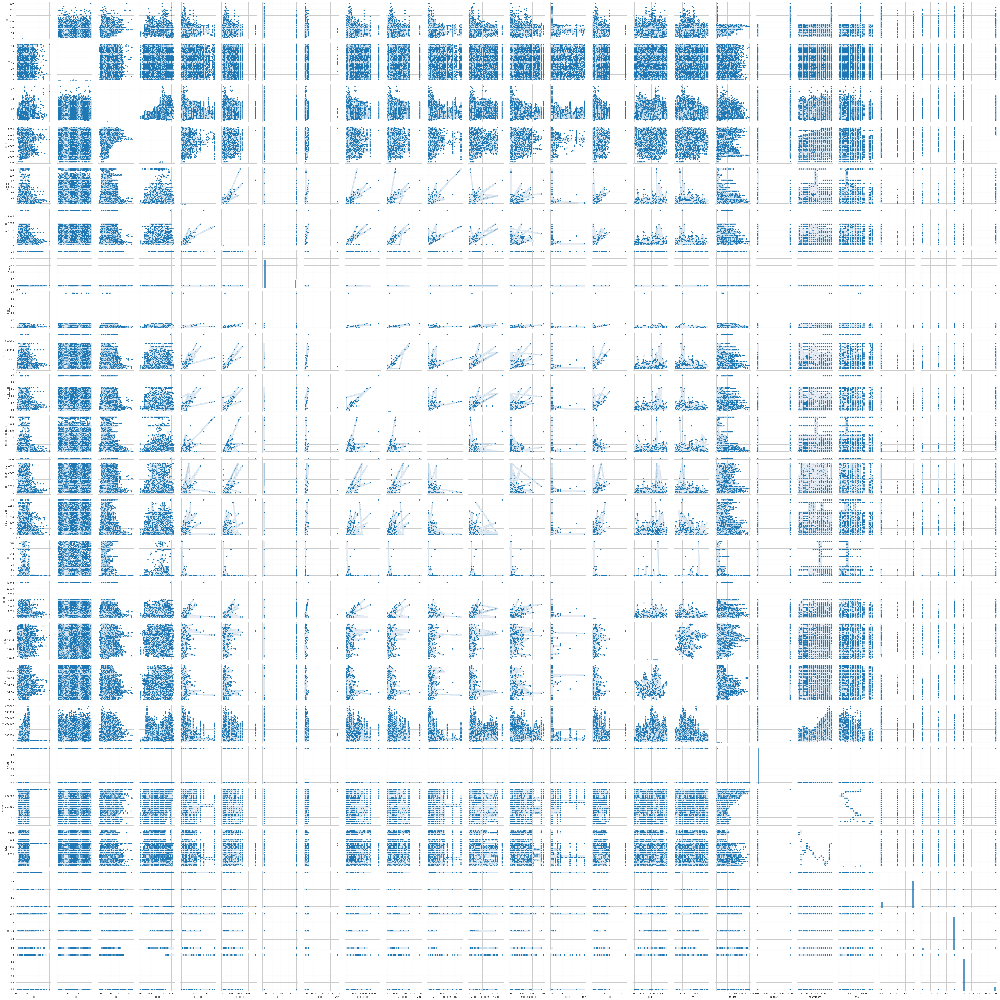

In [124]:
import seaborn as sns
sns.pairplot(merged_df_select);

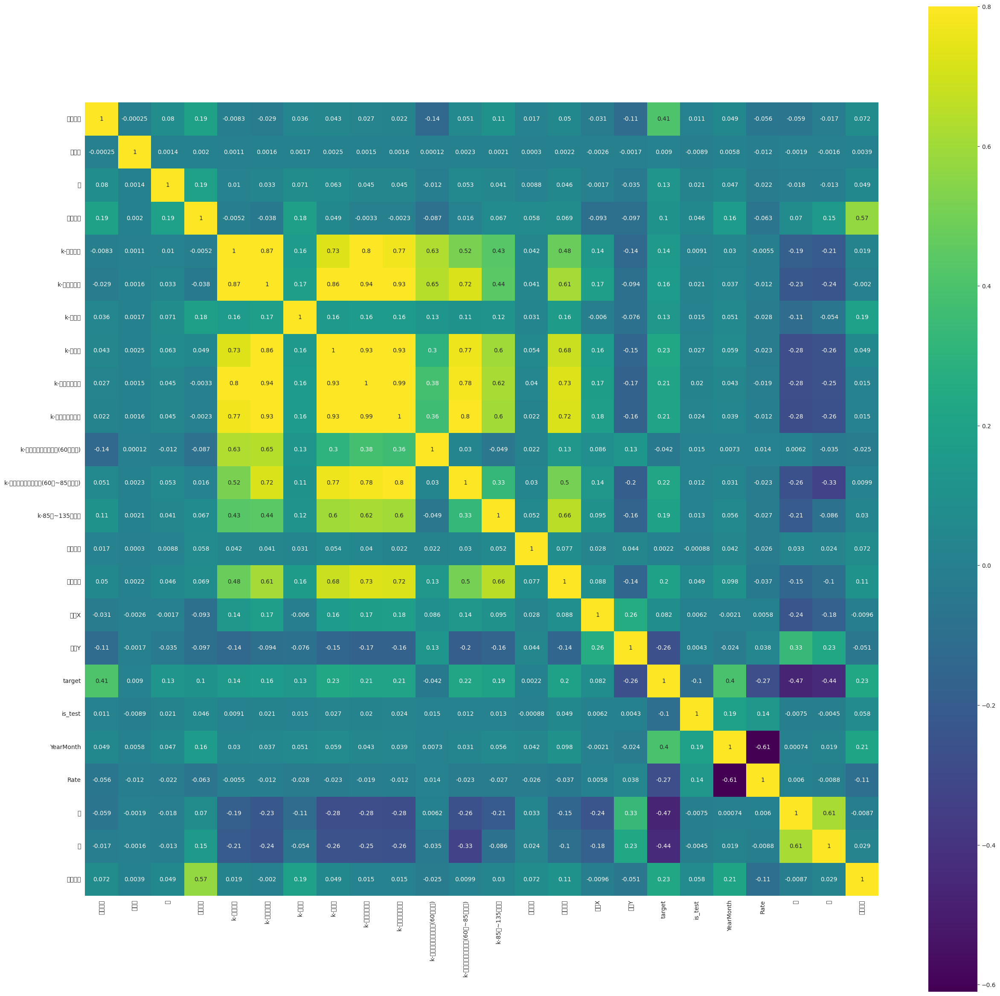

In [125]:
plt.figure(figsize=(30,30))
sns.heatmap(merged_df_select.select_dtypes('number').corr(),vmax=.8, annot=True,square=True,cmap='viridis');

- 위 두 사항 외에도 외부 공공 데이터를 이용하거나, EDA를 통해 더 많은 변수를 제작할 수 있습니다.

## 5. Model Training

- 이제 위에서 만든 파생변수들과 정제한 데이터를 기반으로 본격적으로 부동산 실거래가를 예측하는 모델링을 진행하겠습니다.
- 모델링에는 `sklearn`의 `RandomForest`를 이용하도록 하겠습니다.

- 참고 ✅
  - `RandomForest`는 배깅(Bagging)의 일종으로, 학습시키는 데이터 뿐 아니라 특성변수(X)들도 무작위로 선택해 트리를 생성하는 방법입니다.
  - 모델 학습 과정에서 서로 다른 N개의 Tree 생성하고, N개의 Tree에서 발생한 Output을 Voting(범주형, 분류문제)하거나, Average(연속형, 회귀문제)해 최종 Output 생성합니다.
  - 이는 High variance, Low bias 상황에서 분산(Variance) 감소에 도움을 줍니다.

In [126]:
# 이제 다시 train과 test dataset을 분할해줍니다. 위에서 제작해 놓았던 is_test 칼럼을 이용합니다.
dt_train = merged_df_select.query('is_test==0')
dt_test = merged_df_select.query('is_test==1')

# 이제 is_test 칼럼은 drop해줍니다.
dt_train.drop(['is_test'], axis = 1, inplace=True)
dt_test.drop(['is_test'], axis = 1, inplace=True)
print(dt_train.shape, dt_test.shape)

(1029574, 46) (9272, 46)


In [127]:
dt_test.head(1)

,번지,본번,부번,아파트명,전용면적,계약일,층,건축년도,도로명,"k-단지분류(아파트,주상복합등등)",...,사용허가여부,관리비 업로드,좌표X,좌표Y,target,YearMonth,Rate,구,동,신축여부
1118822,658-1,658.0,1.0,개포6차우성,79.97,26,5,1987,언주로 3,아파트,...,Y,N,127.05721,37.476763,13250.0,202307,3500.0,0,0,0


In [128]:
# dt_test의 target은 일단 0으로 임의로 채워주도록 하겠습니다.
dt_test['target'] = 0

### 5.1. 범주형 변수 Encoding
- 범주형 변수는 그대로 모델에 투입하면, 모델이 제대로 작동할 수 없습니다.
- 따라서 **레이블 인코딩 과정**을 통해 범주형 변수들을 numeric하게 바꾸는 인코딩 과정을 진행해주도록 하겠습니다.

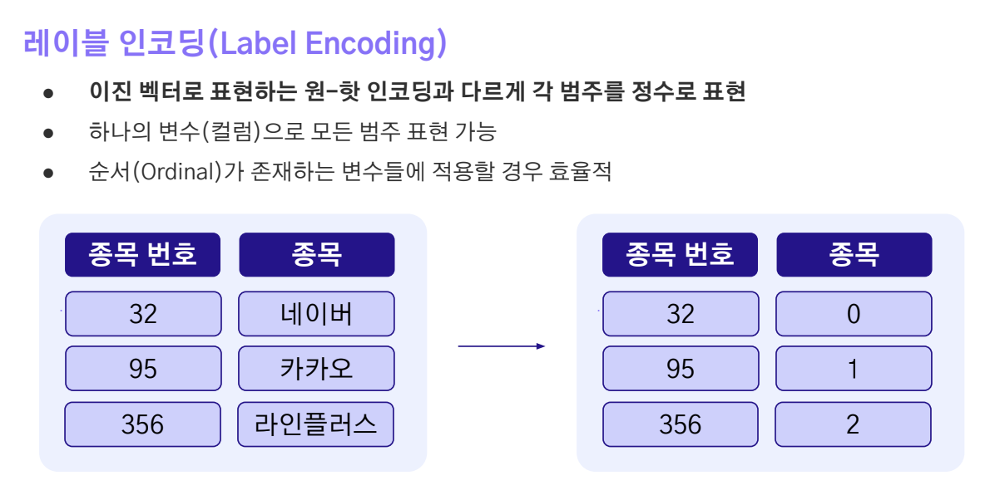

In [129]:
# 파생변수 제작으로 추가된 변수들이 존재하기에, 다시한번 연속형과 범주형 칼럼을 분리해주겠습니다.
continuous_columns_v2 = []
categorical_columns_v2 = []

for column in dt_train.columns:
    if pd.api.types.is_numeric_dtype(dt_train[column]):
        continuous_columns_v2.append(column)
    else:
        categorical_columns_v2.append(column)

print("연속형 변수:", continuous_columns_v2)
print("범주형 변수:", categorical_columns_v2)

연속형 변수: ['전용면적', '계약일', '층', '건축년도', 'k-전체동수', 'k-전체세대수', 'k-시행사', 'k-연면적', 'k-주거전용면적', 'k-관리비부과면적', 'k-전용면적별세대현황(60㎡이하)', 'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하', '건축면적', '주차대수', '좌표X', '좌표Y', 'target', 'YearMonth', 'Rate', '구', '동', '신축여부']
범주형 변수: ['번지', '본번', '부번', '아파트명', '도로명', 'k-단지분류(아파트,주상복합등등)', 'k-전화번호', 'k-팩스번호', 'k-세대타입(분양형태)', 'k-관리방식', 'k-복도유형', 'k-난방방식', 'k-건설사(시공사)', 'k-사용검사일-사용승인일', 'k-수정일자', '고용보험관리번호', '경비비관리형태', '세대전기계약방법', '청소비관리형태', '기타/의무/임대/임의=1/2/3/4', '단지승인일', '사용허가여부', '관리비 업로드']


In [130]:
# 아래에서 범주형 변수들을 대상으로 레이블인코딩을 진행해 주겠습니다.

# 각 변수에 대한 LabelEncoder를 저장할 딕셔너리
label_encoders = {}

# Implement Label Encoding
for col in tqdm( categorical_columns_v2 ):
    lbl = LabelEncoder()

    # Label-Encoding을 fit
    lbl.fit( dt_train[col].astype(str) )
    dt_train[col] = lbl.transform(dt_train[col].astype(str))
    label_encoders[col] = lbl           # 나중에 후처리를 위해 레이블인코더를 저장해주겠습니다.

    # Test 데이터에만 존재하는 새로 출현한 데이터를 신규 클래스로 추가해줍니다.
    for label in np.unique(dt_test[col]):
      if label not in lbl.classes_: # unseen label 데이터인 경우
        lbl.classes_ = np.append(lbl.classes_, label) # 미처리 시 ValueError발생하니 주의하세요!

    dt_test[col] = lbl.transform(dt_test[col].astype(str))

100%|██████████| 23/23 [00:03<00:00,  6.03it/s]


In [131]:
dt_train.head(1)        # 레이블인코딩이 된 모습입니다.

,번지,본번,부번,아파트명,전용면적,계약일,층,건축년도,도로명,"k-단지분류(아파트,주상복합등등)",...,사용허가여부,관리비 업로드,좌표X,좌표Y,target,YearMonth,Rate,구,동,신축여부
0,4282,1114,1,293,79.97,8,3,1987,5520,3,...,1,0,127.05721,37.476763,124000.0,201712,1500.0,0,0,0


### 5.2. Model Training
- 위 데이터를 이용해 모델을 train 해보겠습니다. 모델은 RandomForest를 이용하겠습니다.
- Train과 Valid dataset을 분할하는 과정에서는 `holdout` 방법을 사용하겠습니다. 이 방법의 경우  대략적인 성능을 빠르게 확인할 수 있다는 점에서 baseline에서 사용해보도록 하겠습니다.
  - 이 후 추가적인 eda를 통해서 평가세트와 경향을 맞추거나 kfold와 같은 분포에 대한 고려를 추가할 수 있습니다.

In [132]:
dt_train.head(3)

,번지,본번,부번,아파트명,전용면적,계약일,층,건축년도,도로명,"k-단지분류(아파트,주상복합등등)",...,사용허가여부,관리비 업로드,좌표X,좌표Y,target,YearMonth,Rate,구,동,신축여부
0,4282,1114,1,293,79.97,8,3,1987,5520,3,...,1,0,127.05721,37.476763,124000.0,201712,1500.0,0,0,0
1,4282,1114,1,293,79.97,22,4,1987,5520,3,...,1,0,127.05721,37.476763,123500.0,201712,1500.0,0,0,0
2,4282,1114,1,293,54.98,28,5,1987,5520,3,...,1,0,127.05721,37.476763,91500.0,201712,1500.0,0,0,0


In [133]:
dt_test.head(3)

,번지,본번,부번,아파트명,전용면적,계약일,층,건축년도,도로명,"k-단지분류(아파트,주상복합등등)",...,사용허가여부,관리비 업로드,좌표X,좌표Y,target,YearMonth,Rate,구,동,신축여부
1118822,4282,1114,1,293,79.9700,26,5,1987,5520,3,...,1,0,127.057210,37.476763,0,202307,3500.0,0,0,0
1118823,4258,1107,1,294,108.2017,15,10,2021,431,3,...,1,0,127.056394,37.484892,0,202308,3500.0,0,0,1
1118824,4259,1108,0,298,161.0000,28,15,1984,429,3,...,1,0,127.055990,37.483894,0,202307,3500.0,0,0,0


In [757]:
# 데이터 프레임 예비 저장
dt_train2 = dt_train
dt_test2 = dt_test

In [756]:
# 예비 불러오기
dt_train = dt_train2
dt_test = dt_test2

In [339]:
# dt_train['k-건설사(시공사)'].value_counts()

In [755]:
# dt_train = dt_train[['아파트명','전용면적','YearMonth','구','동','target']]
# dt_train.sample(10)

,아파트명,전용면적,YearMonth,구,동,target
176695,3281,75.8600,200909,0,2,66500.0
222850,397,116.9862,202306,2,1,270000.0
1000328,5500,62.6000,201001,2,2,28000.0
786468,634,84.9830,201402,2,2,50750.0
8237,5151,84.9880,201712,2,2,74400.0
669568,4860,59.3400,201508,2,2,29900.0
938334,4248,84.9000,201104,2,2,39500.0
524856,5031,57.2400,201704,0,2,35000.0
227433,1230,83.0100,202204,2,2,59500.0
9536,4481,59.4900,201802,2,2,32000.0


In [622]:
# dt_test = dt_test[['아파트명','전용면적','YearMonth','구','동','target']]
# dt_test

,아파트명,전용면적,YearMonth,구,동,target
636736,283,79.9700,202307,0,0,0
636737,284,108.2017,202308,0,0,0
636738,288,161.0000,202307,0,0,0
636739,288,133.4600,202308,0,0,0
636740,288,104.4300,202308,0,0,0
...,...,...,...,...,...,...
646003,3188,84.6500,202307,2,2,0
646004,3188,84.6200,202307,2,2,0
646005,3188,101.6500,202308,2,2,0
646006,3188,84.9400,202309,2,2,0


In [134]:
assert dt_train.shape[1] == dt_test.shape[1]          # train/test dataset의 shape이 같은지 확인해주겠습니다.

In [135]:
# Target과 독립변수들을 분리해줍니다.
y_train = dt_train['target']
X_train = dt_train.drop(['target'], axis=1)

# Hold out split을 사용해 학습 데이터와 검증 데이터를 8:2 비율로 나누겠습니다.
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.2, random_state=2023)

In [136]:
# RandomForestRegressor를 이용해 회귀 모델을 적합시키겠습니다.
model = RandomForestRegressor(n_estimators=5, criterion='squared_error', random_state=1, n_jobs=-1)
model.fit(X_train, y_train)
pred = model.predict(X_test)

In [137]:
# 회귀 관련 metric을 통해 train/valid의 모델 적합 결과를 관찰합니다.
print(f'RMSE test: {np.sqrt(metrics.mean_squared_error(y_test, pred))}')
print(f'MSE test: {(metrics.mean_squared_error(y_test, pred))}')

RMSE test: 5828.585657964673
MSE test: 33972410.77223149


In [138]:
col_idxs = {}
for idx, col in enumerate(list(X_train.columns)):
    col_idxs[col] = idx
import re
X_train2 = X_train.rename(columns = col_idxs)
X_val2 = X_test.rename(columns = col_idxs)

In [139]:
import lightgbm as lgb

gbm = lgb.LGBMRegressor(n_estimators=100000,
                        metric="rmse")
gbm.fit(X_train2, y_train,
        eval_set=[(X_train2, y_train), (X_val2, y_test)],
        eval_metric='rmse',
        categorical_feature="auto",
        callbacks=[lgb.early_stopping(stopping_rounds=300),
                   lgb.log_evaluation(period=10, show_stdv=True)]
)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.126430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6549
[LightGBM] [Info] Number of data points in the train set: 823659, number of used features: 45
[LightGBM] [Info] Start training from score 53212.591237
Training until validation scores don't improve for 300 rounds
[10]	training's rmse: 20471.3	valid_1's rmse: 20413.7
[20]	training's rmse: 15465.2	valid_1's rmse: 15441.3
[30]	training's rmse: 13419.7	valid_1's rmse: 13418.2
[40]	training's rmse: 12304	valid_1's rmse: 12323.3
[50]	training's rmse: 11579.7	valid_1's rmse: 11614
[60]	training's rmse: 11013.7	valid_1's rmse: 11058.6
[70]	training's rmse: 10605.6	valid_1's rmse: 10662.1
[80]	training's rmse: 10302.2	valid_1's rmse: 10370.4
[90]	training's rmse: 10027.7	valid_1's rmse: 10103.9
[100]	training's rmse: 9800.96	valid_1's rmse: 9891.98
[110]	training's rmse: 9614.45	valid_1's rmse: 9714.78

KeyboardInterrupt: 

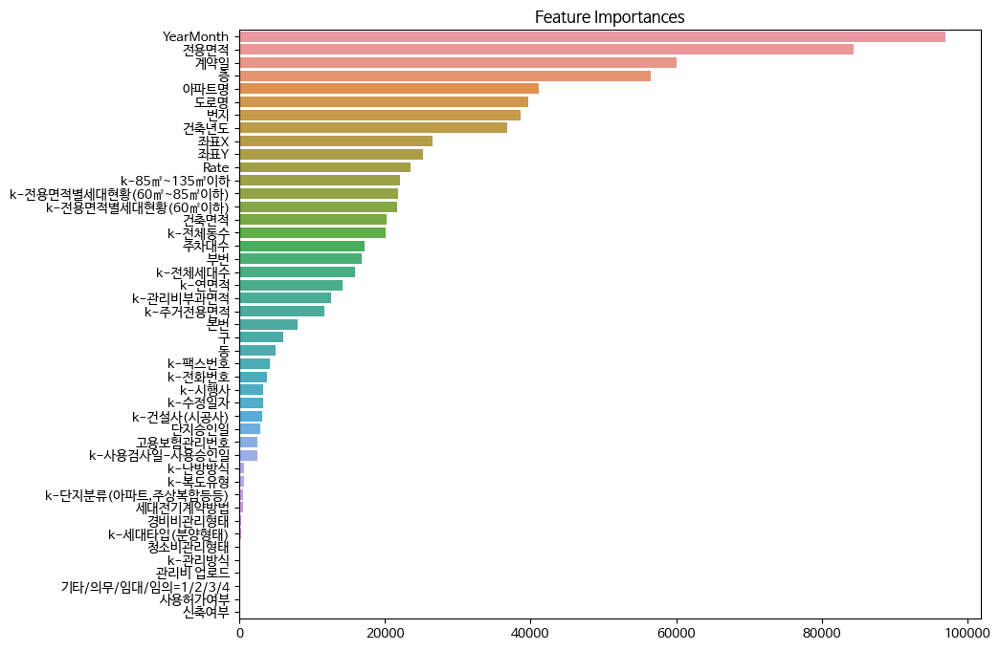

In [764]:
# 위 feature importance를 시각화해봅니다.
importances = pd.Series(gbm.feature_importances_, index=list(X_train.columns))
importances = importances.sort_values(ascending=False)

plt.figure(figsize=(10,8))
plt.title("Feature Importances")
sns.barplot(x=importances, y=importances.index)
plt.show()

In [441]:
pred = gbm.predict(X_val2)

In [765]:
import xgboost as xgb

# XGBoost 모델 생성 및 훈련
xgb_model = xgb.XGBRegressor(n_estimators=100000, learning_rate=0.05, max_depth=7, subsample=0.8, colsample_bytree=0.8, random_state=2023)
xgb_model.fit(X_train, y_train, early_stopping_rounds=130, eval_set=[(X_test, y_test)], verbose=True)


[0]	validation_0-rmse:34529.59473
[1]	validation_0-rmse:33206.45317
[2]	validation_0-rmse:31969.06165
[3]	validation_0-rmse:30811.77957
[4]	validation_0-rmse:29857.36652
[5]	validation_0-rmse:28799.17900
[6]	validation_0-rmse:27790.66974
[7]	validation_0-rmse:26926.87903
[8]	validation_0-rmse:26022.42405
[9]	validation_0-rmse:25336.28139
[10]	validation_0-rmse:24526.16693
[11]	validation_0-rmse:23799.74897
[12]	validation_0-rmse:23118.18648
[13]	validation_0-rmse:22460.19446
[14]	validation_0-rmse:21814.45167
[15]	validation_0-rmse:21252.06351
[16]	validation_0-rmse:20697.36550
[17]	validation_0-rmse:20196.73994
[18]	validation_0-rmse:19674.98246
[19]	validation_0-rmse:19265.05861
[20]	validation_0-rmse:18812.71307
[21]	validation_0-rmse:18374.66354
[22]	validation_0-rmse:17982.42241
[23]	validation_0-rmse:17617.33288
[24]	validation_0-rmse:17261.88396
[25]	validation_0-rmse:16973.92676
[26]	validation_0-rmse:16651.36775
[27]	validation_0-rmse:16341.30392
[28]	validation_0-rmse:16046.1

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.05, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100000, n_jobs=None,
             num_parallel_tree=None, random_state=2023, ...)

In [631]:
pred = xgb_model.predict(X_test)

In [ ]:
# 위 feature importance를 시각화해봅니다.
importances = pd.Series(xgb_model.feature_importances_, index=list(X_train.columns))
importances = importances.sort_values(ascending=False)

plt.figure(figsize=(10,8))
plt.title("Feature Importances")
sns.barplot(x=importances, y=importances.index)
plt.show()

In [ ]:
pred = xgb_model.predict(X_val2)

In [89]:
'''from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import RidgeCV
from sklearn.svm import SVR

# 다른 모델들을 준비합니다.
estimators = [
    ('lgbm', lgb.LGBMRegressor(n_estimators=10000, random_state=2023)),
    ('xgb', xgb.XGBRegressor(n_estimators=10000, learning_rate=0.01, random_state=2023)),
    ('svr', SVR(C=1, gamma='auto'))
]

# 스태킹 모델 초기화
stacking_reg = StackingRegressor(estimators=estimators, final_estimator=RidgeCV())

# 스태킹 모델 학습
stacking_reg.fit(X_train, y_train)

# 스태킹 모델을 사용하여 예측
stacked_pred = stacking_reg.predict(X_test)'''


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1815
[LightGBM] [Info] Number of data points in the train set: 895057, number of used features: 16
[LightGBM] [Info] Start training from score 58000.483999


In [768]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
pipeline = make_pipeline(StandardScaler(), LinearRegression())

pipeline.fit(X_train, y_train)
score = pipeline.score(X_test, y_test)

In [769]:
pipeline.score(X_train, y_train)

0.6386418885054033

In [637]:
# 학습된 모델을 저장합니다. Pickle 라이브러리를 이용하겠습니다.
with open('saved_model.pkl', 'wb') as f:
    pickle.dump(xgb_model, f)

- 랜덤포레스트의 하이퍼파라미터도 데이터에 맞게 지정해줄 수 있습니다. 데이터에 맞는 하이퍼파라미터를 찾는 것도 성능 향상에 도움이 될 수 있습니다.

In [541]:
# 회귀 관련 metric을 통해 train/valid의 모델 적합 결과를 관찰합니다.
print(f'RMSE test: {np.sqrt(metrics.mean_squared_error(y_test, pred))}')

RMSE test: 12664.175133757972


- 변수 중요도도 확인해보도록 하겠습니다.

In [ ]:
# 위 feature importance를 시각화해봅니다.
importances = pd.Series(model.feature_importances_, index=list(X_train.columns))
importances = importances.sort_values(ascending=False)

plt.figure(figsize=(10,8))
plt.title("Feature Importances")
sns.barplot(x=importances, y=importances.index)
plt.show()

In [772]:
from catboost import CatBoostRegressor

regressor = CatBoostRegressor(iterations=200000,
                              random_seed=42,
                              verbose=10,
                              eval_metric="RMSE"
                              )
regressor.fit(X_train, y_train,
              eval_set=(X_test,y_test),
              early_stopping_rounds=50)

Learning rate set to 0.003298
0:	learn: 36000.1281969	test: 35847.3562567	best: 35847.3562567 (0)	total: 30.9ms	remaining: 4h 17m 31s
10:	learn: 35219.8803049	test: 35071.7492977	best: 35071.7492977 (10)	total: 338ms	remaining: 4h 15m 51s
20:	learn: 34469.5744985	test: 34325.5867263	best: 34325.5867263 (20)	total: 641ms	remaining: 4h 14m 13s
30:	learn: 33742.6546593	test: 33603.2244070	best: 33603.2244070 (30)	total: 946ms	remaining: 4h 14m 17s
40:	learn: 33043.6909289	test: 32908.6143742	best: 32908.6143742 (40)	total: 1.25s	remaining: 4h 15m 2s
50:	learn: 32369.8723940	test: 32239.1558702	best: 32239.1558702 (50)	total: 1.56s	remaining: 4h 15m 25s
60:	learn: 31722.2137320	test: 31596.8097692	best: 31596.8097692 (60)	total: 1.87s	remaining: 4h 15m 35s
70:	learn: 31102.3555306	test: 30981.6132534	best: 30981.6132534 (70)	total: 2.18s	remaining: 4h 15m 43s
80:	learn: 30502.7939999	test: 30386.9835898	best: 30386.9835898 (80)	total: 2.48s	remaining: 4h 15m 38s
90:	learn: 29927.1636520	te

In [174]:
# 학습된 모델을 저장합니다. Pickle 라이브러리를 이용하겠습니다.
with open('saved_model.pkl', 'wb') as f:
    pickle.dump(gbm, f)

### 5.3. Feature selection

- 어떤 변수가 유용한 변수인지 확인해보기 위해 permutation selection을 이용해보겠습니다.

In [ ]:
# Permutation importance 방법을 변수 선택에 이용해보겠습니다.
perm = PermutationImportance(model,        # 위에서 학습된 모델을 이용하겠습니다.
                             scoring = 'neg_mean_squared_error',        # 평가 지표로는 회귀문제이기에 negative rmse를 사용합니다. (neg_mean_squared_error : 음의 평균 제곱 오차)
                             random_state = 42,
                             n_iter=3).fit(X_val, y_val)
eli5.show_weights(perm, feature_names = X_val.columns.tolist())    # valid data에 대해 적합시킵니다.

- 분석 결과 "계약년", "전용면적" 변수가 유의한 변수로 보입니다. 따라서 이 변수로 또 다른 파생변수를 더 생성해보거나, 중요도가 낮아보이는 변수를 제거해 차원의 저주를 막아볼 수도 있습니다.

### 5.4. Valid prediction 분석

- 예측값을 분석해보기 위해 valid prediction을 확인해보겠습니다.

In [650]:
# Validation dataset에 target과 pred 값을 채워주도록 하겠습니다.
X_val2['target'] = y_test
X_val2['pred'] = pred

In [651]:
# Squared_error를 계산하는 함수를 정의하겠습니다.
def calculate_se(target, pred):
    squared_errors = (target - pred) ** 2
    return squared_errors

# RMSE 계산
squared_errors = calculate_se(X_val2['target'], X_val2['pred'])
X_val2['error'] = squared_errors

In [652]:
# Error가 큰 순서대로 sorting 해 보겠습니다.
X_val_sort = X_val2.sort_values(by='error', ascending=False)       # 내림차순 sorting

In [653]:
X_val_sort.head()

,0,1,2,3,4,target,pred,error
248477,2039,108.5000,201910,0,0,129000.0,317163.781250,3.540561e+10
248479,2039,108.5000,201912,0,0,125000.0,287684.906250,2.646638e+10
130203,5161,59.6860,202112,0,2,270000.0,107888.703125,2.628007e+10
110018,1083,84.9800,202211,0,0,100000.0,256121.171875,2.437382e+10
116685,1136,84.9984,202206,0,1,160000.0,311447.593750,2.293637e+10


In [654]:
X_val_sort['error'].sum()

7253497925944.682

- 예측을 잘 하지 못한 top 100개의 데이터와 예측을 잘한 top 100개의 데이터를 비교해보겠습니다.

In [642]:
X_val_sort_top100 = X_val2.sort_values(by='error', ascending=False).head(100)        # 예측을 잘 하지못한 top 100개의 data
X_val_sort_tail100 = X_val2.sort_values(by='error', ascending=False).tail(100)       # 예측을 잘한 top 100개의 data

In [ ]:
# 해석을 위해 레이블인코딩 된 변수를 복원해줍니다.
error_top100 = X_val_sort_top100.copy()
for column in categorical_columns_v2 :     # 앞서 레이블 인코딩에서 정의했던 categorical_columns_v2 범주형 변수 리스트를 사용합니다.
    error_top100[column] = label_encoders[column].inverse_transform(X_val_sort_top100[column])

best_top100 = X_val_sort_tail100.copy()
for column in categorical_columns_v2 :     # 앞서 레이블 인코딩에서 정의했던 categorical_columns_v2 범주형 변수 리스트를 사용합니다.
    best_top100[column] = label_encoders[column].inverse_transform(X_val_sort_tail100[column])

In [355]:
display(error_top100.head(1))
display(best_top100.head(1))

,0,1,2,3,4,5,6,7,8,9,...,41,42,43,44,45,46,47,target,pred,error
20798,3951,1114,1,4408,84.9979,29,5,2017,6998,0,...,126.960858,37.487309,202203,1400.0,0,277,1,330000.0,208911.44134,1.466244e+10


NameError: name 'best_top100' is not defined

- 이제 분포를 비교해보도록 하겠습니다.

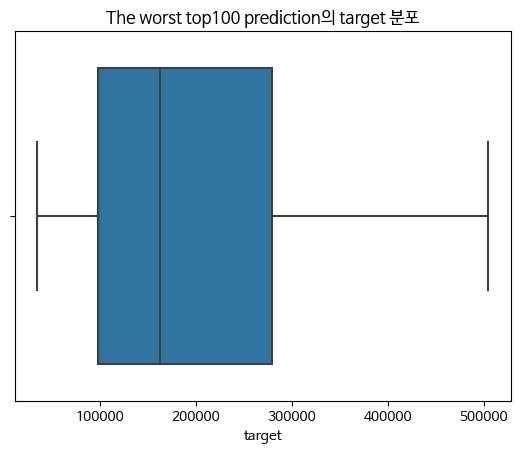

NameError: name 'best_top100' is not defined

In [356]:
sns.boxplot(data = error_top100, x='target')
plt.title('The worst top100 prediction의 target 분포')
plt.show()

sns.boxplot(data = best_top100, x='target', color='orange')
plt.title('The best top100 prediction의 target 분포')
plt.show()

In [ ]:
sns.histplot(data = error_top100, x='구', alpha=0.5)
sns.histplot(data = best_top100, x='구', color='orange', alpha=0.5)
plt.title('구 분포 비교')
plt.show()

In [ ]:
sns.histplot(data = error_top100, x='Rate', alpha=0.5)
sns.histplot(data = best_top100, x='Rate', color='orange', alpha=0.5)
plt.title('Rate 분포 비교')
plt.show()

In [ ]:
sns.histplot(data = error_top100, x='층', alpha=0.5)
sns.histplot(data = best_top100, x='층', color='orange', alpha=0.5)
plt.title('층 분포 비교')
plt.show()

In [ ]:
sns.histplot(data = error_top100, x='신축여부', alpha=0.5)
sns.histplot(data = best_top100, x='신축여부', color='orange', alpha=0.5)
plt.title('신축여부 분포 비교')
plt.show()

In [ ]:
sns.histplot(data = error_top100, x='건축년도', alpha=0.5)
sns.histplot(data = best_top100, x='건축년도', color='orange', alpha=0.5)
plt.title('건축년도 분포 비교')
plt.show()

In [ ]:
sns.histplot(data = error_top100, x='target', alpha=0.5)
sns.histplot(data = best_top100, x='target', color='orange', alpha=0.5)
plt.title('target 분포 비교')
plt.show()

In [ ]:
sns.histplot(data = error_top100, x='도로명', alpha=0.5)
sns.histplot(data = best_top100, x='도로명', color='orange', alpha=0.5)
plt.title('도로명 분포 비교')
plt.show()

In [ ]:
sns.histplot(data = error_top100, x='k-건설사(시공사)', alpha=0.5)
sns.histplot(data = best_top100, x='k-건설사(시공사)', color='orange', alpha=0.5)
plt.title('k-건설사(시공사) 분포 비교')
plt.show()

In [ ]:
sns.histplot(data = error_top100, x='YearMonth', alpha=0.5)
sns.histplot(data = best_top100, x='YearMonth', color='orange', alpha=0.5)
plt.title('YearMonth 분포 비교')
plt.show()

- Taget 분포를 보니 좋은 예측을 보인 top 100개의 data보다 상대적으로 나쁜 예측을 보인 top 100 dataset들이 높은 가격을 보였음을 확인할 수 있습니다. 이에 대한 모델링 및 처리가 필요해보입니다.

In [ ]:
sns.histplot(data = error_top100, x='전용면적', alpha=0.5)
sns.histplot(data = best_top100, x='전용면적', color='orange', alpha=0.5)
plt.title('전용면적 분포 비교')
plt.show()

- 전용면적 또한 나쁜 예측을 보인 집들이 더 넓음을 확인할 수 있습니다.

## 6. Inference

In [644]:
dt_test.head(5)      # test dataset에 대한 inference를 진행해보겠습니다.

,아파트명,전용면적,YearMonth,구,동,target
636736,283,79.9700,202307,0,0,0
636737,284,108.2017,202308,0,0,0
636738,288,161.0000,202307,0,0,0
636739,288,133.4600,202308,0,0,0
636740,288,104.4300,202308,0,0,0


In [645]:
# 저장된 모델을 불러옵니다.
with open('saved_model.pkl', 'rb') as f:
    model = pickle.load(f)

In [646]:
%%time
X_test = dt_test.drop(['target'], axis=1)

# Test dataset에 대한 inference를 진행합니다.
real_test_pred = model.predict(X_test)

CPU times: user 12.4 s, sys: 11.9 ms, total: 12.4 s
Wall time: 4.93 s


In [647]:
real_test_pred          # 예측값들이 출력됨을 확인할 수 있습니다.

array([205864.34 , 256613.31 , 224254.55 , ...,  97104.016,  77126.28 ,
        62336.523], dtype=float32)

## 7. Output File Save

In [648]:
# 앞서 예측한 예측값들을 저장합니다.
preds_df = pd.DataFrame(real_test_pred.astype(int), columns=["target"])
preds_df.to_csv('output.csv', index=False)